In [62]:
import spacy
import pandas as pd
import json
import os
import re
from tqdm.notebook import tqdm
from rake_nltk import Rake
from spacy.matcher import Matcher 
import en_core_web_sm
import networkx as nx
import matplotlib.pyplot as plt
import numpy as np



In [63]:
directories = ['../data/biorxiv_medrxiv/', '../data/comm_use_subset/','../data/custom_license/', '../data/noncomm_use_subset/']

In [64]:
files = []
for directory in directories:
    for (dirpath, dirnames, filenames) in os.walk(directory):
        if filenames != []:
            files.append({'dirpath':dirpath, 'filenames':[names for names in filenames if ('1.1.pickle' in names)]})

In [65]:
df = pd.read_pickle(files[0]['dirpath']+files[0]['filenames'][0])

In [66]:
abstract_tripplets = df[['Abs Tri', 'ID', 'Task List']]

tri_df_list = []
for index, tri in abstract_tripplets.iterrows():
    tri_df = pd.read_json(tri['Abs Tri'])
    tri_df['ID'] = tri['ID']
    tri_df['Task List'] =  str(tri['Task List'])
    tri_df_list.append(tri_df)

tri_df = pd.concat(tri_df_list, ignore_index = True)

In [67]:
def create_kg(pairs):
    k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',edge_attr = ['relation' ,'ID', 'Task List'],
            create_using=nx.MultiDiGraph())
    return k_graph

def draw_kg(k_graph):
    node_deg = nx.degree(k_graph)
    layout = nx.spring_layout(k_graph, k=0.15, iterations=20)
    plt.figure(num=None, figsize=(120, 90), dpi=80)
    nx.draw_networkx(
        k_graph,
        node_size=[int(deg[1]) * 500 for deg in node_deg],
        arrowsize=20,
        linewidths=1.5,
        pos=layout,
        edge_color='red',
        edgecolors='black',
        node_color='white',
        )
    
    subject = []
    obj = []
    relation = []
    tasks = []
    for element in list(k_graph.edges()):
        subject.append(element[0])
        obj.append(element[1])
        relation.append(k_graph.get_edge_data(element[0],element[1])[0]['relation'] + ' :: ' + 
                       k_graph.get_edge_data(element[0],element[1])[0]['Task List'])
    labels = dict(zip(list(zip(subject, obj)),relation))
    nx.draw_networkx_edge_labels(k_graph, pos=layout, edge_labels=labels,
                                 font_color='red')
    plt.axis('off')
    plt.savefig('test_graph.png')
    #plt.show()
    

In [68]:
k_graph = create_kg(tri_df)

In [69]:
print(nx.info(k_graph))

Name: 
Type: MultiDiGraph
Number of nodes: 1707
Number of edges: 1028
Average in degree:   0.6022
Average out degree:   0.6022


In [70]:
node_rank = nx.degree_centrality(k_graph)

In [71]:
node_rank_sorted = {k: v for k, v in sorted(node_rank.items(), key=lambda item: item[1],reverse=True)}

In [72]:
top_nodes = [k for k in node_rank_sorted.keys()][1:1000]

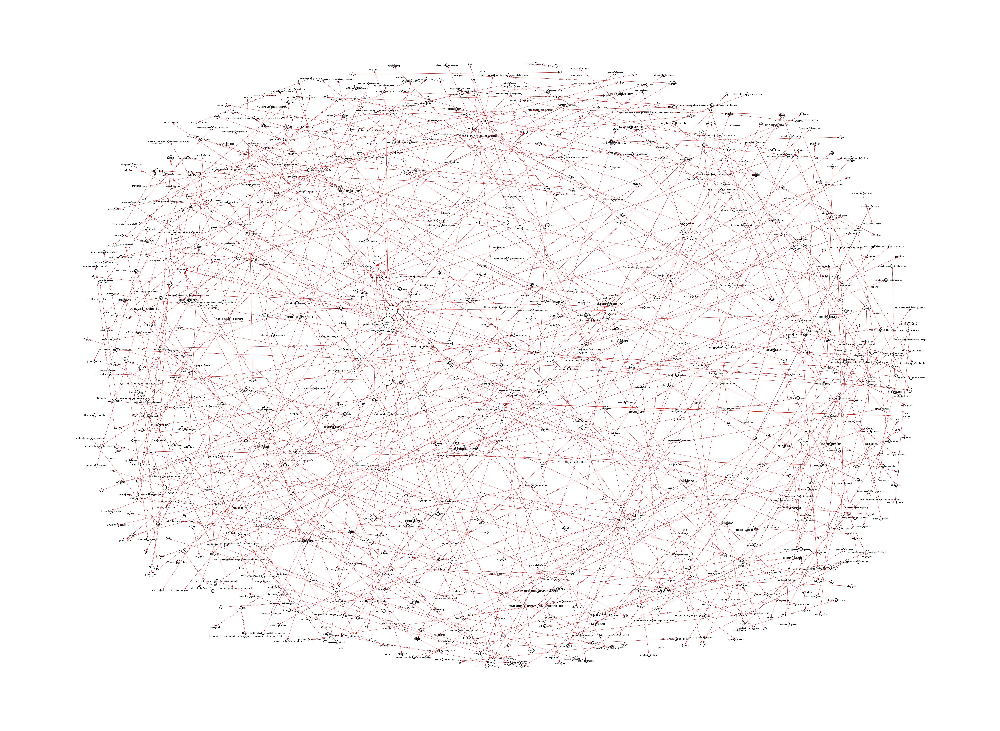

In [76]:
draw_kg(k_graph.subgraph(top_nodes))

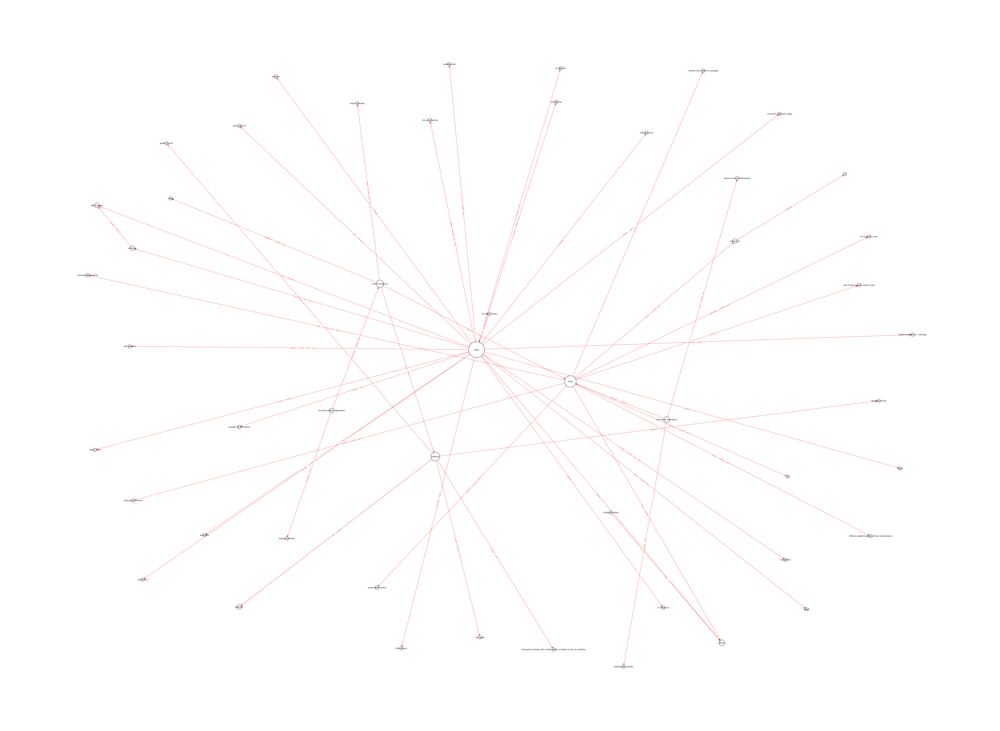

In [78]:
draw_kg(nx.ego_graph(k_graph, 'china',3, undirected=True))